#Downloading YOLOv3 Model and Configuration Files

In [ ]:
download_url = "https://pjreddie.com/media/files/yolov3.weights"
desired_path = "/content/yolov3.weights"
!wget {download_url} -O {desired_path}

download_url = "https://github.com/pjreddie/darknet/raw/master/cfg/yolov3.cfg"
desired_path = "/content/yolov3.cfg"
!wget {download_url} -O {desired_path}

download_url = "https://github.com/pjreddie/darknet/blob/master/data/coco.names"
desired_path = "/content/coco.names"
!wget {download_url} -O {desired_path}

--2023-11-08 20:31:33--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘/content/yolov3.weights’

/content/yolov3.wei 100%[===================>] 236.52M  26.0MB/s    in 11s     

2023-11-08 20:31:44 (22.2 MB/s) - ‘/content/yolov3.weights’ saved [248007048/248007048]

--2023-11-08 20:31:44--  https://github.com/pjreddie/darknet/raw/master/cfg/yolov3.cfg
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg [following]
--2023-11-08 20:31:44--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw

#Importing the Necessary Libraries

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Loading YOLO Model and COCO Labels

In [ ]:
net = cv2.dnn.readNet('yolov3.cfg', 'yolov3.weights')

classes = []
with open('coco.names', 'r') as f:
    classes = f.read().strip().split('\n')

#Image Path List Initialization

In [ ]:
image_paths = [
    '/content/dog.jpg',
    '/content/eagle.jpg',
    '/content/giraffe.jpg',
    '/content/horses.jpg',
    '/content/kite.jpg',
    '/content/person.jpg'
]

# Object Detection and Bounding Box Visualization

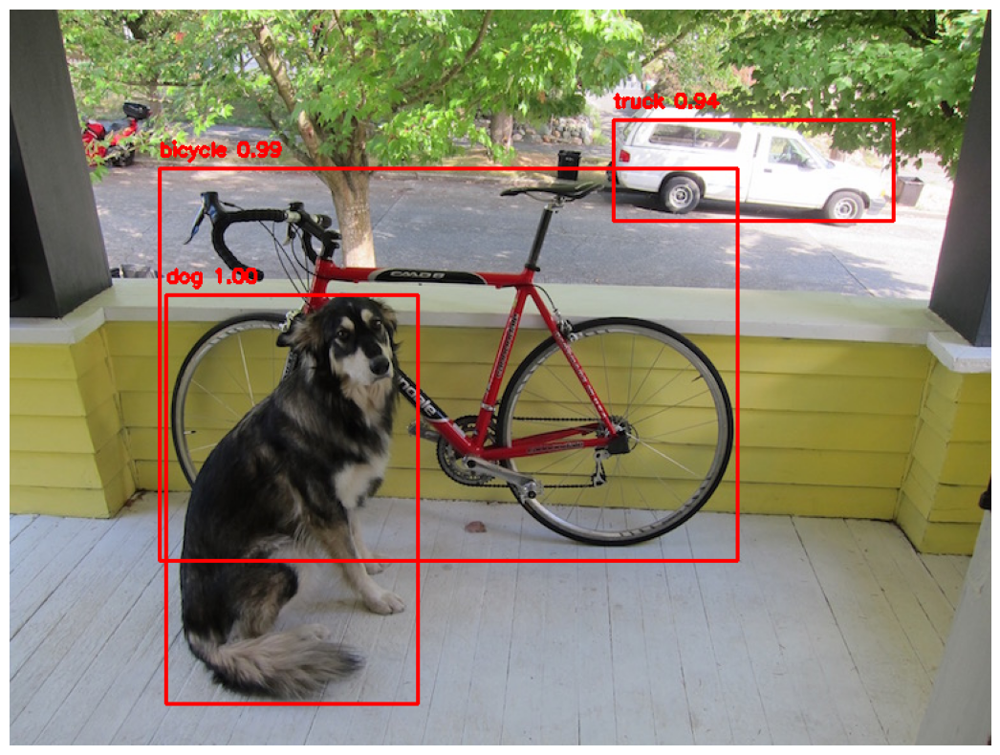

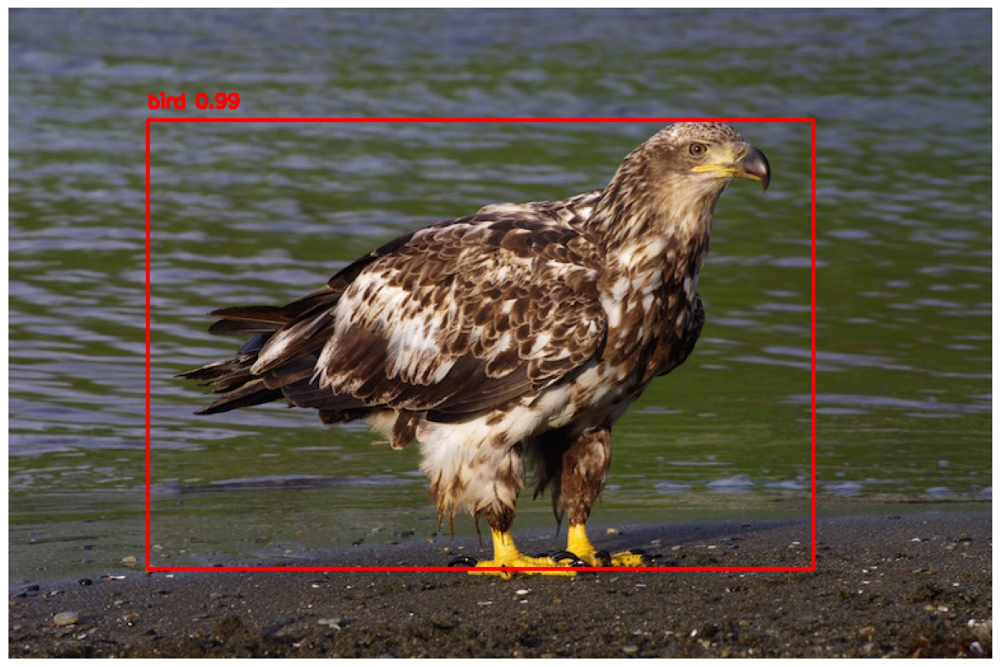

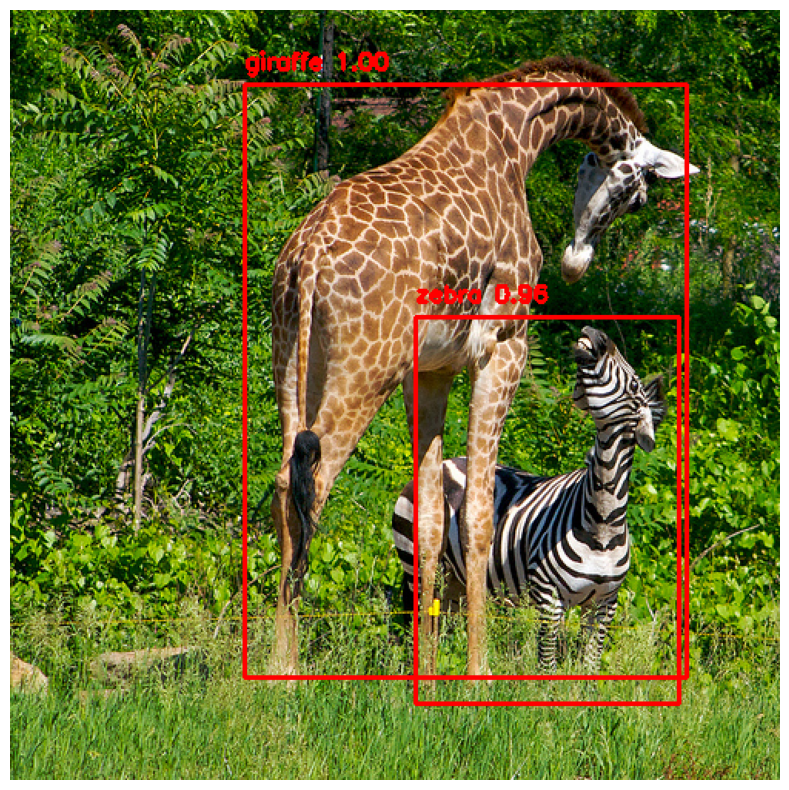

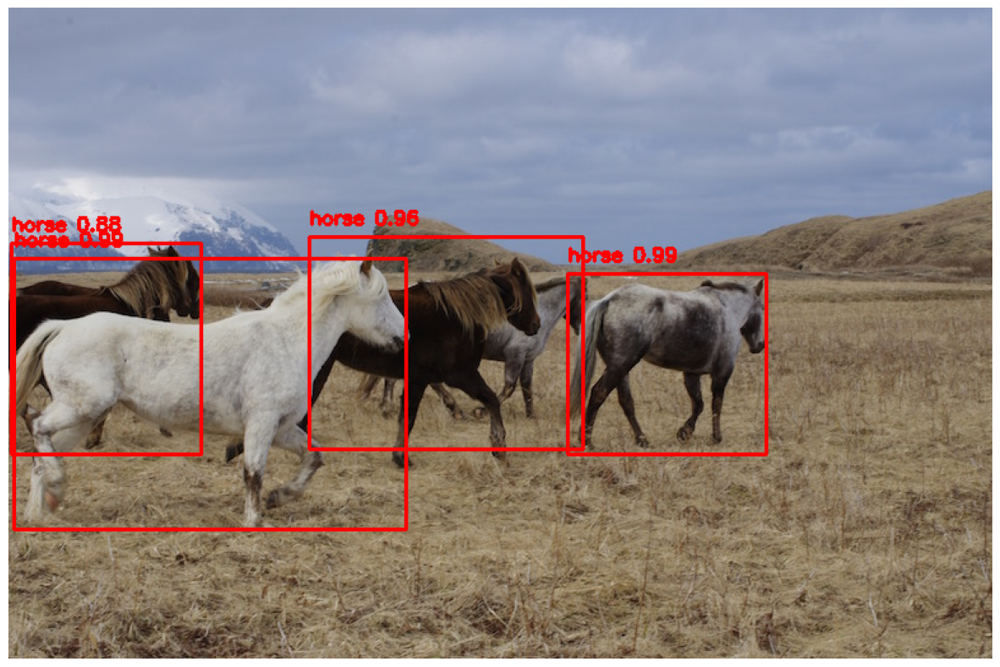

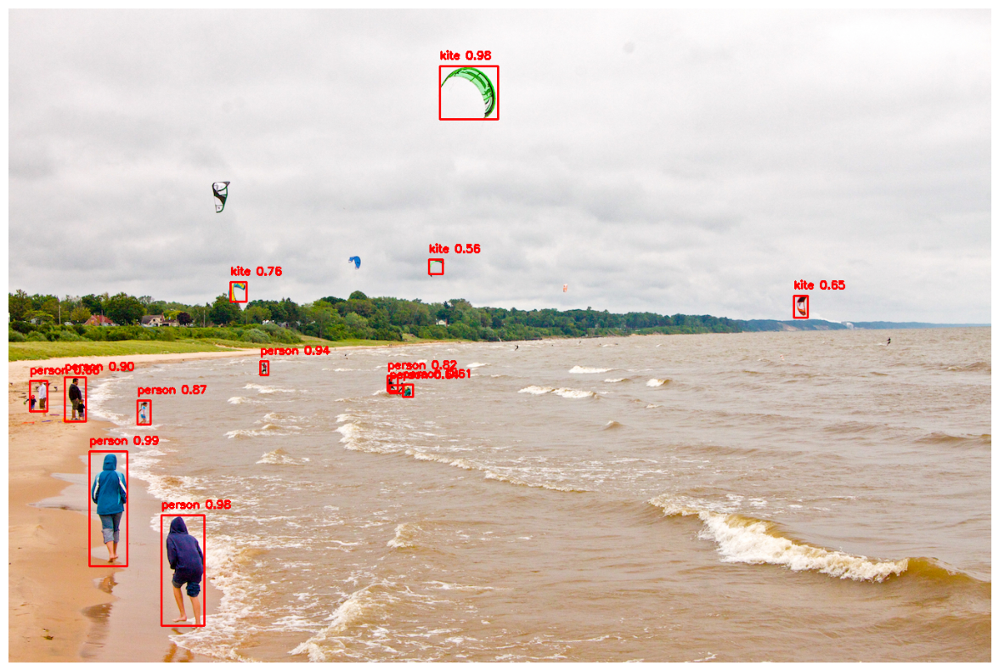

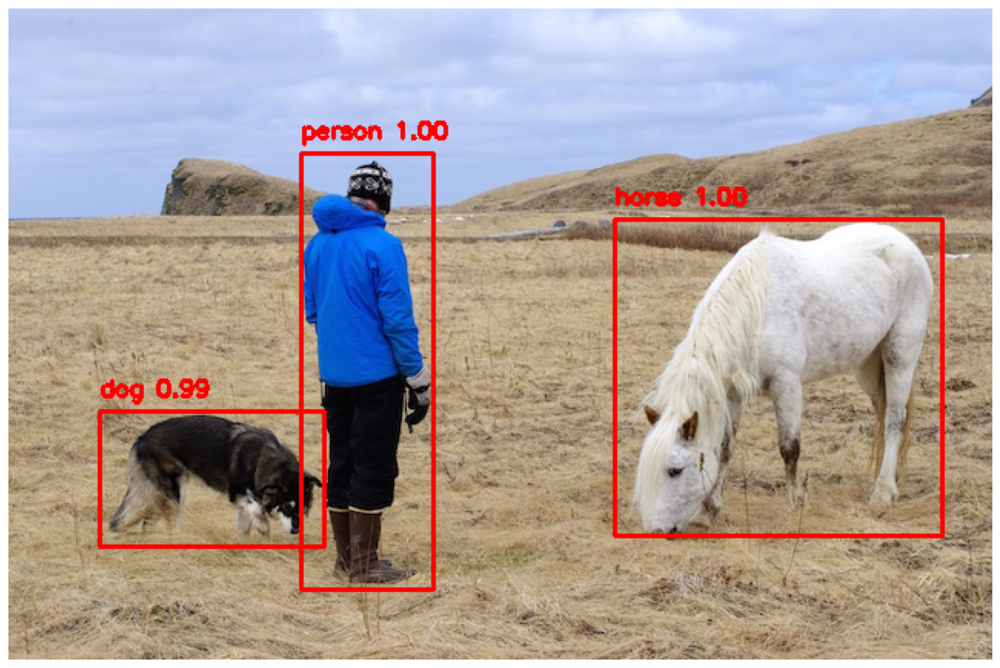

In [ ]:
for image_path in image_paths:
    image = cv2.imread(image_path)
    height, width = image.shape[:2]
    blob = cv2.dnn.blobFromImage(image, 0.00392, (416, 416), (0, 0, 0), True, crop=False)

    net.setInput(blob)
    outs = net.forward(net.getUnconnectedOutLayersNames())

    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                class_ids.append(class_id)
                confidences.append(float(confidence))
                boxes.append([x, y, w, h])

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            confidence = confidences[i]
            color = (0, 0, 255)
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, f"{label} {confidence:.2f}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

#Pedestrian Detection using YOLOv3

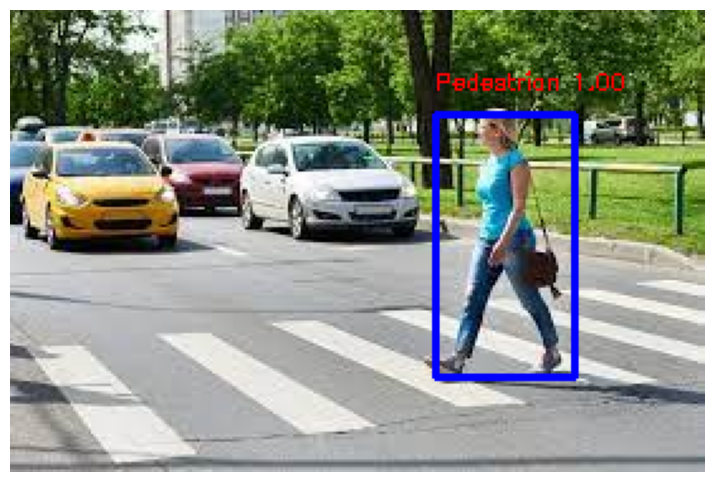

In [ ]:
net = cv2.dnn.readNet('yolov3.weights', 'yolov3.cfg')

def detect_pedestrians(image_path):
    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    blob = cv2.dnn.blobFromImage(image, 1/255, (416, 416), swapRB=True, crop=False)
    net.setInput(blob)

    layer_names = net.getUnconnectedOutLayersNames()
    detections = net.forward(layer_names)

    pedestrian_boxes = []
    confidences = []

    for detection in detections:
        for obj in detection:
            scores = obj[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]

            if confidence > 0.5 and class_id == 0:   #If you want to detect a different specific object, you can change the class_id according to the COCO labels.
                center_x = int(obj[0] * width)
                center_y = int(obj[1] * height)
                w = int(obj[2] * width)
                h = int(obj[3] * height)

                x = int(center_x - w/2)
                y = int(center_y - h/2)

                pedestrian_boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    nms_threshold = 0.5
    indexes = cv2.dnn.NMSBoxes(pedestrian_boxes, confidences, 0.5, nms_threshold)

    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = pedestrian_boxes[i]
            label = 'Pedestrian'
            confidence = confidences[i]
            color = (255, 0, 0)
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, f"{label} {confidence:.2f}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 255), 1)

    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

image_path = '/content/ped.jpg'

detect_pedestrians(image_path)